# Winter Arctic sea ice state variability (updates through to April 2026)

**Summary**: In this notebook, we provide the fifth update to the original winter Arctic sea ice thickness notebooks with the addition of the 2025 to 2026 winter from the Version 4 monthly gridded winter Arctic sea ice thickness dataset IS2SITMOGR4 (based on new Release 007 ATL10 freeboards). 

**Author**: Alek Petty

**Version history**: Version 1 (08/2026)


In [1]:
### Import notebook dependencies
 
# Regular Python library imports 
import xarray as xr 
import numpy as np
import holoviews as hv
import pandas as pd
import hvplot.pandas # noqa

# Helper functions for reading the data from the bucket and plotting
from utils.read_data_utils import read_IS2SITMOGR4, read_book_data
from utils.plotting_utils import static_winter_comparison_lineplot, staticArcticMaps, staticArcticMaps_2026, interactiveArcticMaps, compute_gridcell_winter_means, interactive_winter_comparison_lineplot # Plotting utils 

# Plotting dependencies
#%config InlineBackend.figure_format = 'retina'
import matplotlib as mpl
# Sets figure size in the notebook
mpl.rcParams['figure.dpi'] = 200 

# Remove warnings to improve display
import warnings 
warnings.filterwarnings('ignore') 

In [2]:
# Set some plotting parameters
mpl.rcParams.update({
    "text.usetex": False,  # Use LaTeX for rendering
    "font.family": "sans-serif",
    'mathtext.fontset': 'stixsans',
    "lines.linewidth": 1.,
    "font.size": 8,
    #"lines.alpha": 0.8,
    "axes.labelsize": 8,
    "xtick.labelsize": 8,
    "ytick.labelsize": 8,
    "legend.fontsize": 8
})
mpl.rcParams['font.sans-serif'] = ['Arial']

### Read in the Version 4 monthly gridded winter Arctic sea ice data
There are now three ways to grab the data. 
1. 'netcdf-local': where the data is stored as netcdf files in a local directory (local_data_path). This is generally the fastest and best if you plan to do multiple executions. But you need to run Option #3 below to get the data first...

2. 'zarr-s3-v4': grab the data through a Zarr store on S3. This is slower than the above but very convenient as you dont need to download anything! Should be much faster if running this on AWS (us-west-2). Note we point to the new Zarr store extending through April 2026.

3. 'netcdf-s3': the slowest option, but it does download the files and open you up to the fast Option #1. 


In [3]:
#%%time
#IS2SITMOGR4_v4_test = read_IS2SITMOGR4(data_type='netcdf-local', local_data_path='./data/IS2SITMOGR4/', version='V4') 
#IS2SITMOGR4_v4_test

In [4]:
#%%time
#IS2SITMOGR4_v4_test = read_IS2SITMOGR4(data_type='netcdf-s3', version='V4') 
#IS2SITMOGR4_v4_test

In [5]:
%%time
IS2SITMOGR4_v4 = read_IS2SITMOGR4(data_type='zarr-s3-v4', version='V4',
                                  zarr_path='s3://icesat-2-sea-ice-us-west-2/IS2SITMOGR4_V4/zarr/IS2SITMOGR4_V4_201811-202604.zarr') 


load zarr from S3 bucket
zarr_path: s3://icesat-2-sea-ice-us-west-2/IS2SITMOGR4_V4/zarr/IS2SITMOGR4_V4_201811-202604.zarr


CPU times: user 7.71 s, sys: 965 ms, total: 8.67 s
Wall time: 33.2 s


## Winter mean maps, extended and focussing in on the new 2025-2026 winter data

In [6]:
# Years over which to perform analysis (start year of that winter period)
years = [x for x in range(2018, 2025+1)]

freeboard_winter_means = compute_gridcell_winter_means(IS2SITMOGR4_v4.freeboard_int, years=years)
snow_depth_winter_means = compute_gridcell_winter_means(IS2SITMOGR4_v4.snow_depth_int, years=years)
thickness_winter_means = compute_gridcell_winter_means(IS2SITMOGR4_v4.ice_thickness_int, years=years)

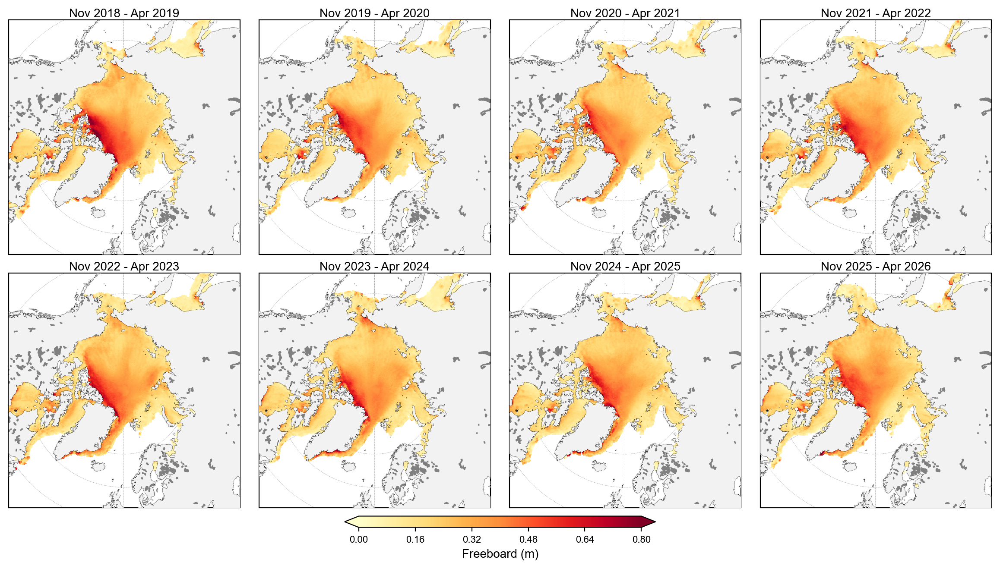

In [7]:
staticArcticMaps_2026(freeboard_winter_means, dates=freeboard_winter_means.time.values,title="", set_cbarlabel = "Freeboard (m)", cmap="YlOrRd", vmin=0, vmax=0.8, out_str='freeboard_winter_2018_2026')

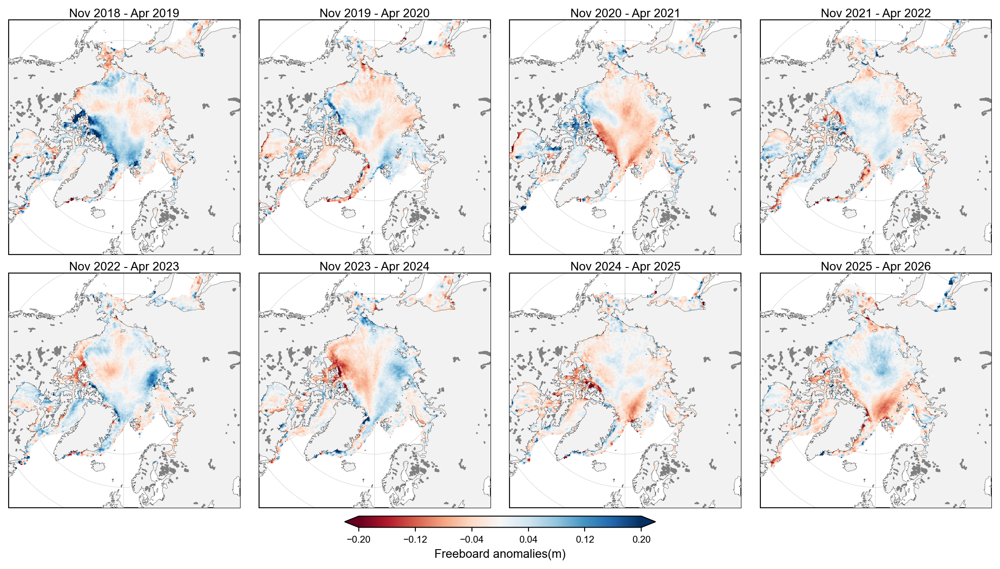

In [8]:
staticArcticMaps_2026(freeboard_winter_means-freeboard_winter_means.mean(axis=0), dates=freeboard_winter_means.time.values,title="", set_cbarlabel = "Freeboard anomalies(m)", cmap="RdBu", vmin=-0.2, vmax=0.2, out_str='freeboard_winter_2018_2026_anoms')

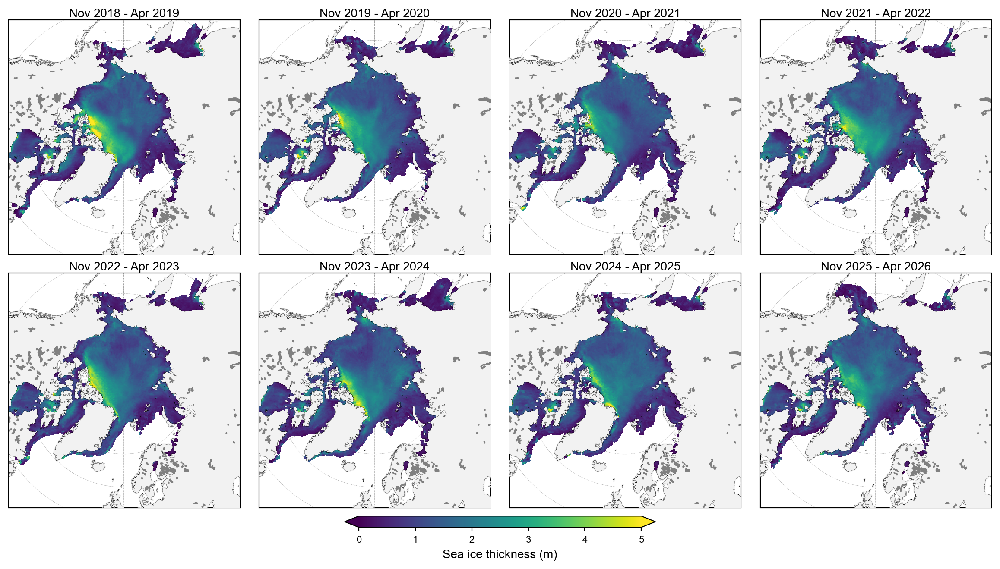

In [9]:
staticArcticMaps_2026(thickness_winter_means, dates=thickness_winter_means.time.values,title="", set_cbarlabel = "Sea ice thickness (m)", cmap="viridis", vmin=0, vmax=5, out_str='thickness_winter_2018_2026')

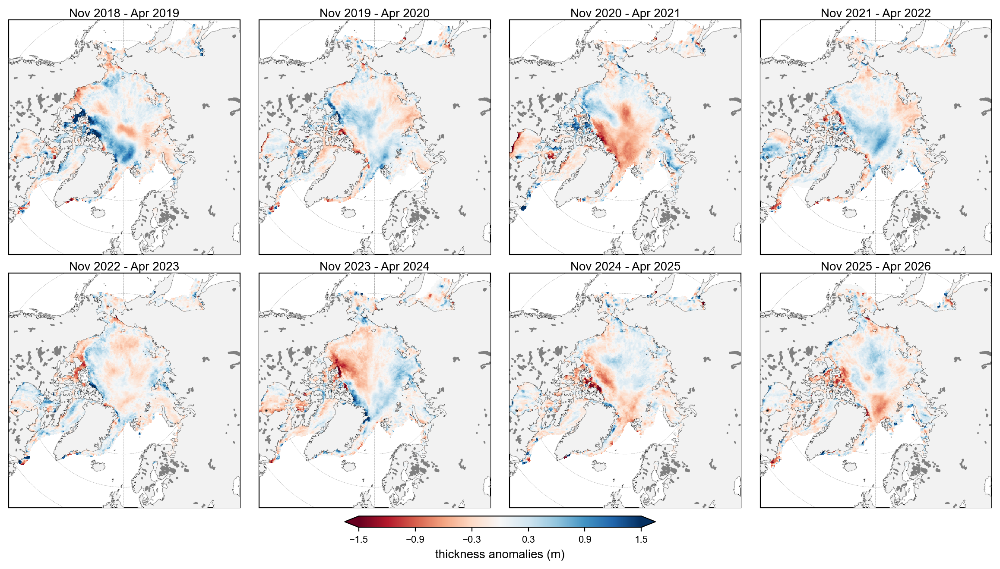

In [10]:
staticArcticMaps_2026(thickness_winter_means-thickness_winter_means.mean(axis=0), dates=thickness_winter_means.time.values,title="", set_cbarlabel = "thickness anomalies (m)", cmap="RdBu", vmin=-1.5, vmax=1.5, out_str='thickness_winter_2018_2026_anomalies')

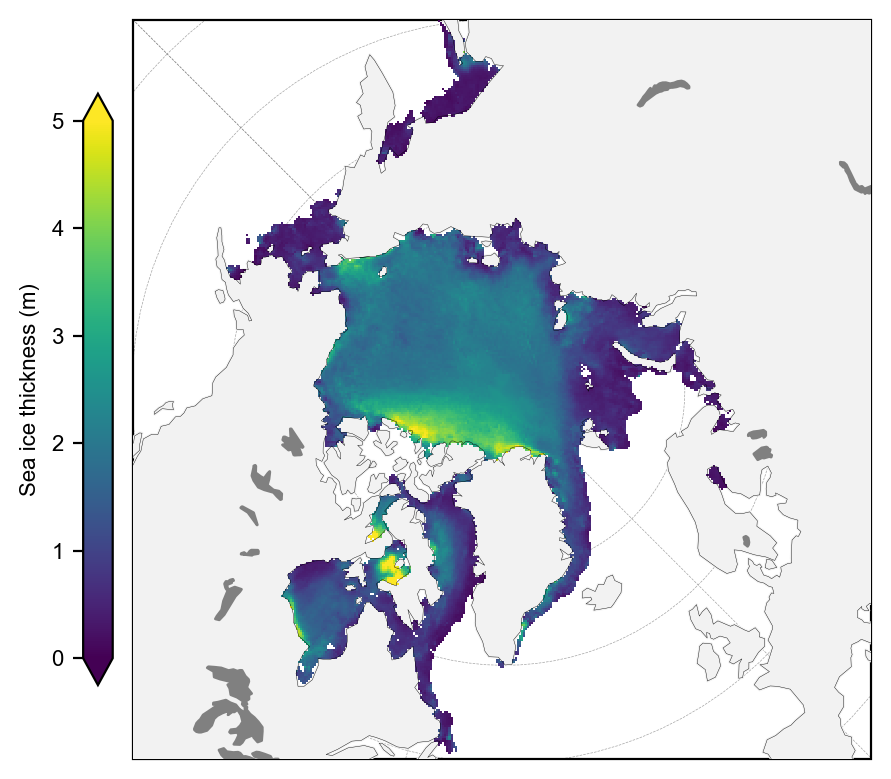

In [11]:
# Select just the April fields (dropping all other months) and compute the mean April state
april_thickness = IS2SITMOGR4_v4.ice_thickness_int.sel(time=IS2SITMOGR4_v4.time.dt.month == 4)
april_mean = april_thickness.mean(dim='time', keep_attrs=True)

# Mean April thickness across 2019-2026 (the climatology used for the anomalies below)
# expand_dims restores a dummy time axis as the plotting utils expect one
staticArcticMaps(april_mean.expand_dims(time=[april_thickness.time.values[0]]), dates=['April 2019-2026 mean'], title="", set_cbarlabel="Sea ice thickness (m)", col_wrap=1, cmap="viridis", vmin=0, vmax=5, out_str='thickness_april_2019_2026_mean')

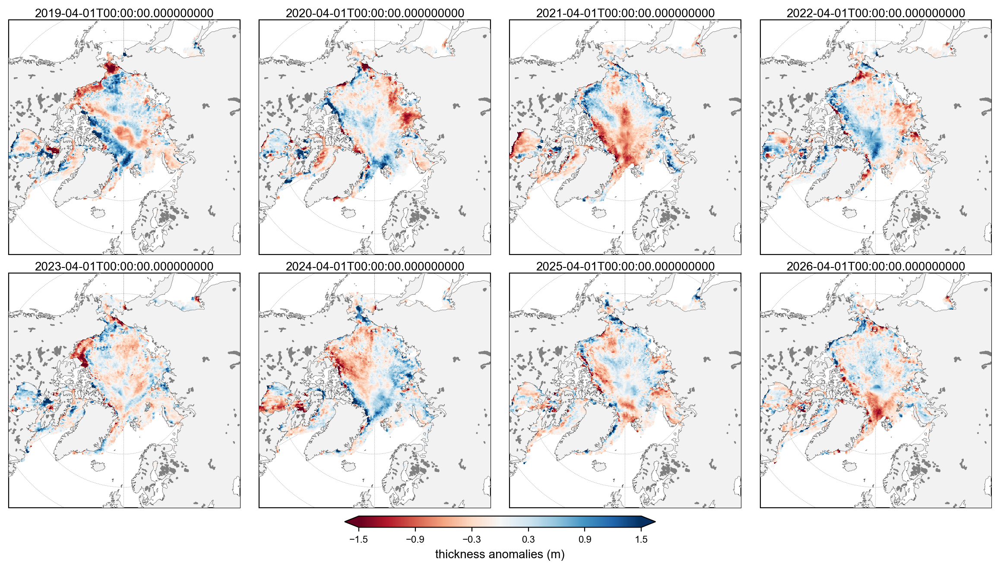

In [12]:
staticArcticMaps_2026(april_thickness - april_mean, dates=april_thickness.time.values, title="", set_cbarlabel = "thickness anomalies (m)", cmap="RdBu", vmin=-1.5, vmax=1.5, out_str='thickness_april_2019_2026_anomalies')

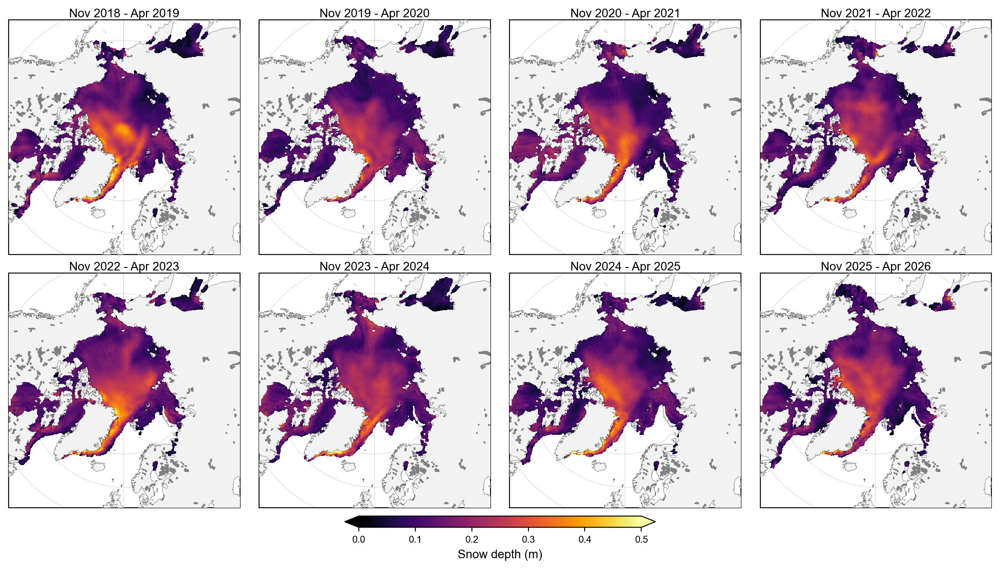

In [13]:
staticArcticMaps_2026(snow_depth_winter_means, dates=snow_depth_winter_means.time.values,title="", set_cbarlabel = "Snow depth (m)", cmap="inferno", vmin=0, vmax=0.5, out_str='snow_depth_winter_2018_2026')

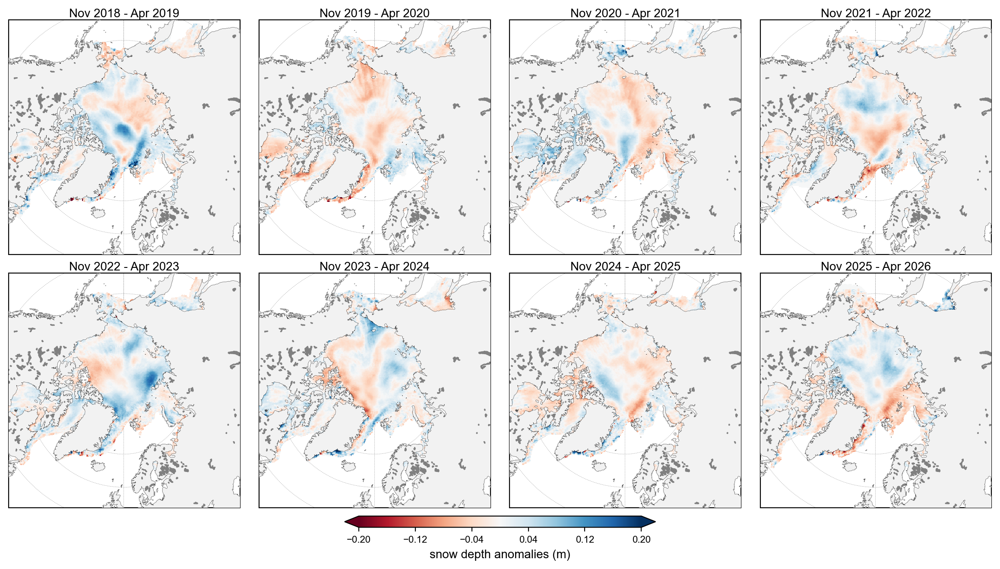

In [14]:
staticArcticMaps_2026(snow_depth_winter_means-snow_depth_winter_means.mean(axis=0), dates=snow_depth_winter_means.time.values,title="", set_cbarlabel = "snow depth anomalies (m)", cmap="RdBu", vmin=-0.2, vmax=0.2, out_str='snow_depth_winter_2018_2026_anoms')

## Updated Petty et al., (2023) time-series plots including winter 2025-2026

### Set some analysis configuration options

In [15]:
# Set a region mask, e.g. to avoid including some of the more uncertain data in the peripheral seas
innerArctic = [1,2,3,4,5]
IS2SITMOGR4_v4_innerArctic = IS2SITMOGR4_v4.where(IS2SITMOGR4_v4.region_mask.isin(innerArctic))

# Drop Sep and October as coverage issues means they are hard to interpret
IS2SITMOGR4_v4_innerArctic = IS2SITMOGR4_v4_innerArctic.where(((IS2SITMOGR4_v4_innerArctic['time.month'] > 10)|(IS2SITMOGR4_v4_innerArctic['time.month'] < 5)), drop=True)

# Uncomment out to set an additional ice type mask too and change the save_label accordingly (0 = FYI, 1 = MYI)
#IS2SITMOGR4_all_innerArctic = IS2SITMOGR4_all_innerArctic.where(IS2SITMOGR4_all_innerArctic.ice_type==1)

save_label='Inner_Arctic'

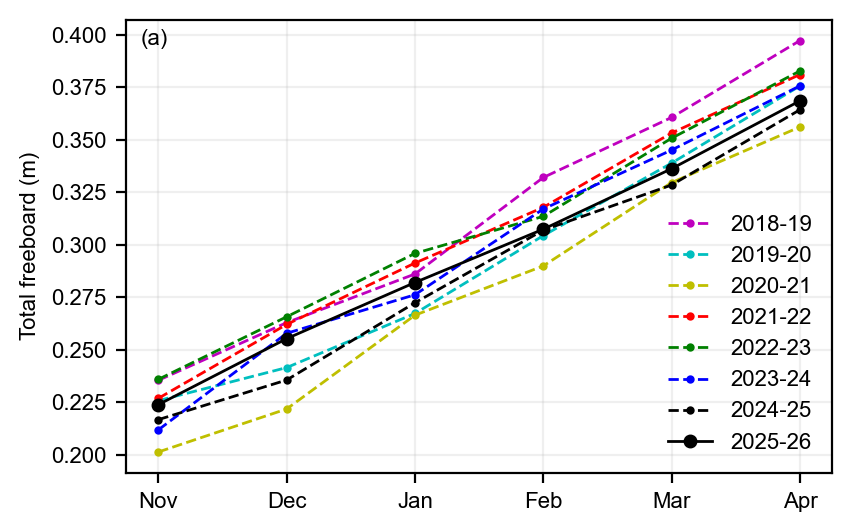

In [16]:
static_winter_comparison_lineplot(IS2SITMOGR4_v4_innerArctic.freeboard, years=years, start_month="Sep", 
                                  figsize=(4.3,2.7), annotation='(a)', set_ylabel=r'Total freeboard (m)', 
                                  fmts = ['m.--','c.--','y.--','r.--','g.--','b.--','k.--', 'ko-'],
                                  save_label=save_label, loc_pos=4, legend=True)

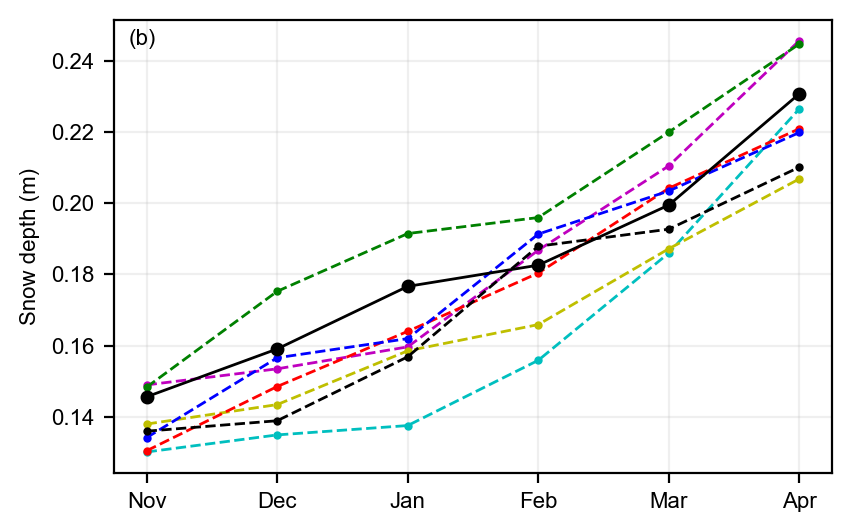

In [17]:
static_winter_comparison_lineplot(IS2SITMOGR4_v4_innerArctic.snow_depth, years=years, start_month="Sep", 
                                  figsize=(4.3,2.7), annotation='(b)',set_ylabel='Snow depth (m)', 
                                  fmts = ['m.--','c.--','y.--','r.--','g.--','b.--','k.--', 'ko-'],
                                  save_label=save_label, legend=False)

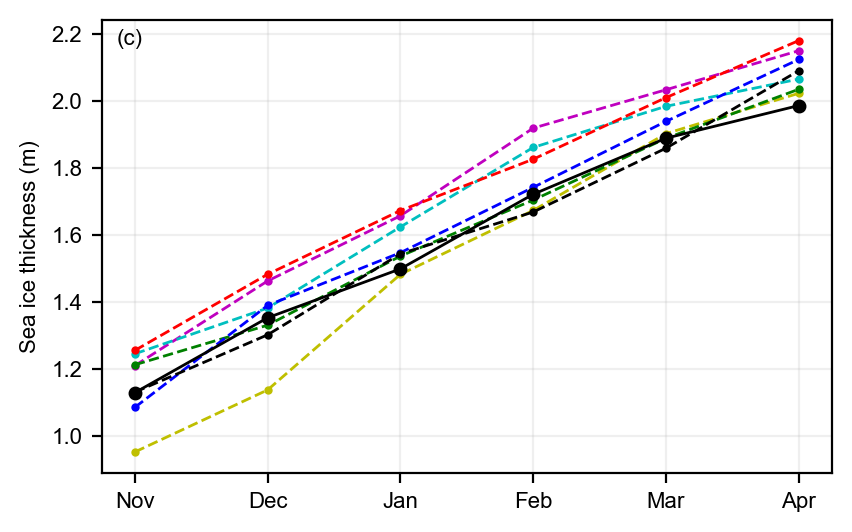

In [18]:
static_winter_comparison_lineplot(IS2SITMOGR4_v4_innerArctic.ice_thickness, 
                                  years=years, start_month="Sep", annotation='(c)', figsize=(4.3,2.7), 
                                  fmts = ['m.--','c.--','y.--','r.--','g.--','b.--','k.--', 'ko-'],
                                  set_ylabel='Sea ice thickness (m)', save_label=save_label, legend=False)

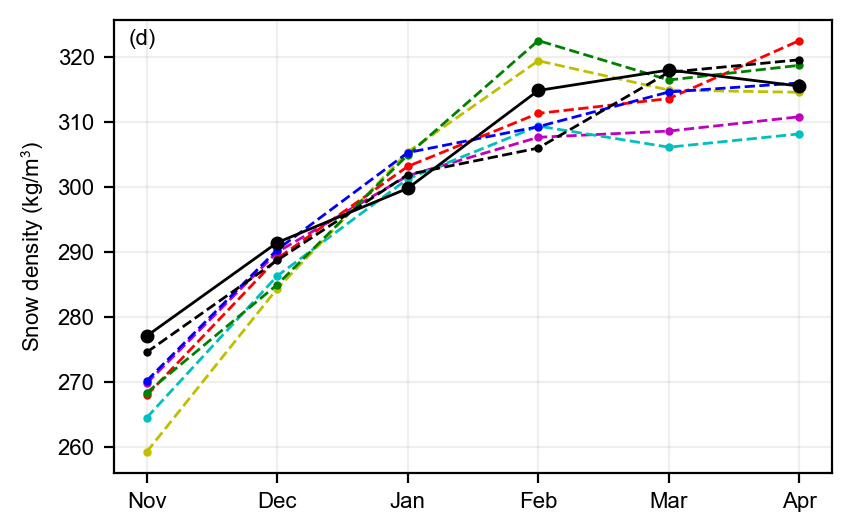

In [19]:
static_winter_comparison_lineplot(IS2SITMOGR4_v4_innerArctic.snow_density, years=years, start_month="Sep", 
                                  figsize=(4.3,2.7), annotation='(d)',set_ylabel=r'Snow density (kg/m$^3$)', 
                                  fmts = ['m.--','c.--','y.--','r.--','g.--','b.--','k.--', 'ko-'],
                                  save_label=save_label, legend=False)

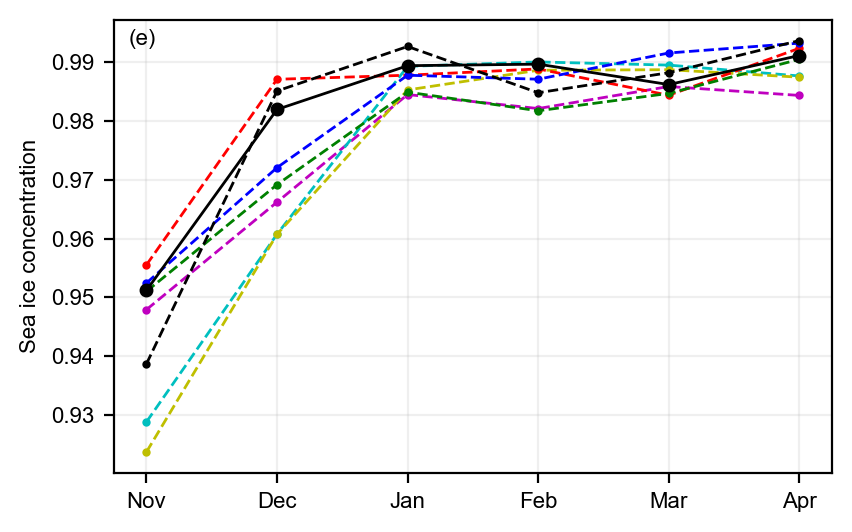

In [20]:
static_winter_comparison_lineplot(IS2SITMOGR4_v4_innerArctic.sea_ice_conc, years=years, start_month="Sep", figsize=(4.3,2.7), annotation='(e)', 
                                  fmts = ['m.--','c.--','y.--','r.--','g.--','b.--','k.--', 'ko-'],
                                  set_ylabel='Sea ice concentration', save_label=save_label, legend=False)

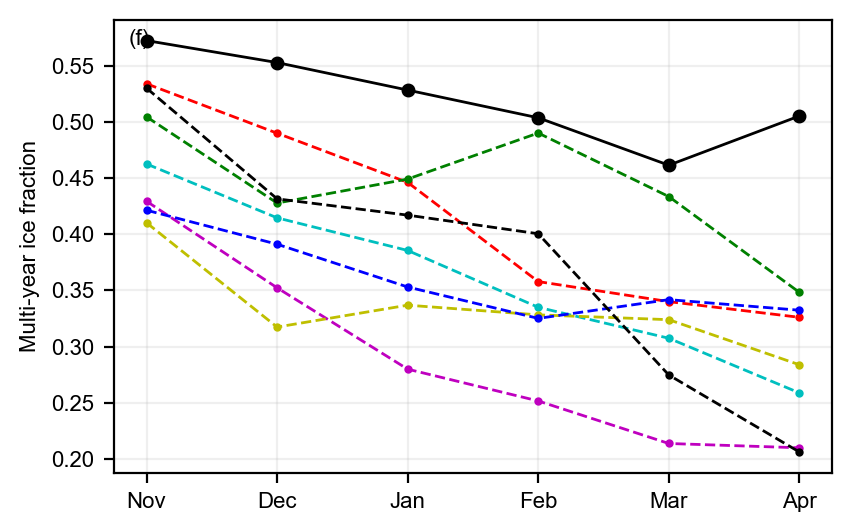

In [21]:
static_winter_comparison_lineplot(IS2SITMOGR4_v4_innerArctic.ice_type, years=years, start_month="Sep", 
                                  figsize=(4.3,2.7), annotation='(f)',set_ylabel='Multi-year ice fraction', 
                                  fmts = ['m.--','c.--','y.--','r.--','g.--','b.--','k.--', 'ko-'],
                                  save_label=save_label, legend=False)

## References


Petty, A. A., Keeney, N., Cabaj, A., Kushner, P., & Bagnardi, M. (2023). Winter Arctic sea ice thickness from ICESat-2: upgrades to freeboard and snow loading estimates and an assessment of the first three winters of data collection. The Cryosphere,17, 127–156, https://doi.org/10.5194/tc-17-127-2023
